In [3]:
import anndata
import numpy as np
import pandas as p
import seaborn as sns
from scipy import stats
import liana as li
import scanpy as sc
import cell2cell as c2c
import decoupler as dc # needed for pathway analysis
from collections import defaultdict
import pickle
import torch
import io
import plotnine as p9
import decoupler as dc # needed for pathway analysis
#from statannotations.Annotator import Annotator
from liana.method import singlecellsignalr, connectome, cellphonedb, natmi, logfc, cellchat, geometric_mean
import os
import omnipath as op
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
from io import BytesIO
import PIL.Image
from typing import Callable
from sklearn.metrics import pairwise

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [4]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 80, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.9.2
scanpy      1.9.6
-----
PIL                 10.4.0
asttokens           NA
attr                23.2.0
backcall            0.2.0
brotli              1.1.0
cell2cell           0.7.4
certifi             2024.06.02
cffi                1.16.0
charset_normalizer  3.3.2
comm                0.2.2
cycler              0.12.1
cython_runtime      NA
dateutil            2.9.0
debugpy             1.8.2
decorator           5.1.1
decoupler           1.6.0
docrep              0.3.2
executing           2.0.1
get_annotations     NA
h5py                3.11.0
idna                3.7
importlib_resources NA
inflect             NA
ipykernel           6.29.5
jedi                0.19.1
joblib              1.4.2
kiwisolver          1.4.5
kneed               0.8.5
liana               1.2.1
llvmlite            0.41.1
matplotlib          3.7.5
mizani              0.9.3
more_itertools      10.3.0
mpl_toolkits        NA
mudata              0.2.3
natsort             8.4.0
networkx            3.

In [5]:
def unpickle_gpu_tensor(filepath: str, processing_unit: str):
    '''
    Function to load a pickled tensor file created using cell2cell with gpu acceleration

    filepath: str = path of the tensor file
    processing_unit: str = processing_unit used in the current environment to load the file onto (either "gpu" or "cpu")
    '''
    class CPU_Unpickler(pickle.Unpickler):
        def find_class(self, module, name):
            if module == 'torch.storage' and name == '_load_from_bytes':
                return lambda b: torch.load(io.BytesIO(b), map_location='cpu')
            else: return super().find_class(module, name)

    processing_unit_values = ['cpu', 'gpu']
    if processing_unit == 'cpu':
        with open(filepath, 'rb') as f:
            tensor = CPU_Unpickler(f).load()
    elif processing_unit == 'gpu':
        with open(filepath, 'rb') as f:
            tensor = pickle.load(f)
    else:
        raise ValueError(f'accelerator must be one of {processing_unit_values}')
    return tensor


def cosine_similarity(vec1, vec2):
    dot_product = np.dot(vec1, vec2)
    norm_vec1 = np.linalg.norm(vec1)
    norm_vec2 = np.linalg.norm(vec2)
    if norm_vec1 == 0 or norm_vec2 == 0:
        return 0.0  
    return dot_product / (norm_vec1 * norm_vec2)

def find_outlier_vectors(
        df: pd.DataFrame,
        col_vec: bool=True,
        normalize_df: bool=True,
        aggregate_func: Callable=np.mean,
        **aggregate_func_argument
):
    if col_vec:
        df = df.T
    if normalize_df:
        df = df.div(df.sum(axis=1), axis=0)
    similarity_matrix = pairwise.cosine_similarity(df)
    np.fill_diagonal(similarity_matrix, 0)
    aggregated_similarity = aggregate_func(similarity_matrix, **aggregate_func_argument)
    indices = df.index[np.argsort(aggregated_similarity)]
    values = np.sort(aggregated_similarity)
    return pd.DataFrame(data=values, index=indices)

def get_tensor_factors(
    tensor: c2c.tensor.PreBuiltTensor
) -> list:
    return list(tensor.factors['Contexts'].columns)

def check_factor_completion(
        factor_df: pd.DataFrame,
        cell_types: set
):
    difference = cell_types.difference(factor_df.index)
    if difference:
        for cell_type in difference:
            factor_df.loc[cell_type] = np.zeros(factor_df.shape[1], dtype=np.float32)
    factor_df = factor_df.sort_index()
    return factor_df

def get_tensor_signalling_arrays(
        tensor: c2c.tensor.PreBuiltTensor,
        cell_types: set,
) -> dict:
    tensor_factors = get_tensor_factors(tensor)
    tensor_signalling_arrays = {}
    for factor in tensor_factors:
        sender_df = check_factor_completion(
            tensor.factors['Sender Cells'],
            cell_types
        )
        receiver_df = check_factor_completion(
            tensor.factors['Receiver Cells'],
            cell_types
        )
        sender_cell_array = sender_df[factor].to_numpy()
        receiver_cell_array = receiver_df[factor].to_numpy()
        tensor_signalling_arrays[factor] = np.concatenate(
            (
                sender_cell_array,
                receiver_cell_array
            )
        )
    return tensor_signalling_arrays

def find_mutual_best_fits(
        tensor_1_signalling_arrays: dict,
        tensor_2_signalling_arrays: dict
) -> dict:
    best_fits_1_to_2 = {}
    for factor1, array1 in tensor_1_signalling_arrays.items():
        best_match = None
        highest_similarity = -1
        for factor2, array2 in tensor_2_signalling_arrays.items():
            similarity = cosine_similarity(array1, array2)
            if similarity > highest_similarity:
                highest_similarity = similarity
                best_match = factor2
        best_fits_1_to_2[factor1] = best_match

    best_fits_2_to_1 = {}
    for factor2, array2 in tensor_2_signalling_arrays.items():
        best_match = None
        highest_similarity = -1
        for factor1, array1 in tensor_1_signalling_arrays.items():
            similarity = cosine_similarity(array2, array1)
            if similarity > highest_similarity:
                highest_similarity = similarity
                best_match = factor1
        best_fits_2_to_1[factor2] = best_match

    mutual_best_fits = {}
    for factor1, best_fit_factor2 in best_fits_1_to_2.items():
        if best_fits_2_to_1.get(best_fit_factor2) == factor1:
            mutual_best_fits[factor1] = best_fit_factor2

    return mutual_best_fits

def return_sender_receiver_factor_df(
        tensor: c2c.tensor.PreBuiltTensor,
        cell_types: set,
        factor_condition: str = None
) -> pd.DataFrame:
    sender_df: pd.DataFrame = check_factor_completion(tensor.factors['Sender Cells'], cell_types)
    sender_df.index = ['sender_' + index for index in sender_df.index]
    receiver_df: pd.DataFrame = check_factor_completion(tensor.factors['Sender Cells'], cell_types)
    receiver_df.index = ['receiver_' + index for index in receiver_df.index]
    sender_receiver_df = pd.concat(
        [
            sender_df,
            receiver_df
        ]
    )
    sender_receiver_df.columns = [f'{factor_condition}_' + column for column in sender_receiver_df.columns]
    return sender_receiver_df

In [6]:
data_dir = os.path.join(os.getcwd(), '.data')
os.makedirs(data_dir, exist_ok=True)
os.listdir(data_dir)

['liana_res_compartment.csv',
 'initial_tensor.pkl',
 'final_tensor.pkl',
 'anndata_liana.h5ad',
 'Marburg_cell_states_locked_ctl240709_COPD.raw.h5ad',
 'final_tensor_compartment_copd_iav.pkl',
 'final_tensor_compartment.pkl',
 'final_tensor_compartment_healthy.pkl',
 'final_tensor_compartment_copd_ctrl.pkl',
 'final_tensor_compartment_healthy_iav.pkl',
 'initial_tensor_compartment.pkl',
 'final_tensor_compartment_healthy_ctrl.pkl',
 'Marburg_cell_states_locked_ctl240709_healthy.raw.h5ad',
 'Marburg_cell_states_locked_ctl240709.raw.h5ad',
 'final_tensor_compartment_COPD.pkl']

In [7]:
adata_path = os.path.join(data_dir, 'Marburg_cell_states_locked_ctl240709.raw.h5ad')
adata_all = sc.read_h5ad(adata_path)
adata_all

AnnData object with n_obs × n_vars = 97573 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', 'IAV_score', 'group', 'Viral_score', 'cell_type', 'cell_states', 'leiden', 'cell_compartment', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'viral_counts', 'infected_status', 'seed_labels', 'batch-scANVI'
    var: 'mt', 'ribo'
    uns: 'cell_compartment_colors', 'cell_states_colors', 'disease_colors', 'group_colors', 'infection_colors'
    obsm: 'X_scANVI', 'X_umap'

In [8]:
sample_key = 'batch'
condition_key = 'group'
groupby = 'cell_compartment'

In [9]:
context_dict = adata_all.obs[[sample_key, condition_key]].drop_duplicates()
context_dict = dict(zip(context_dict[sample_key], context_dict[condition_key]))
context_dict = defaultdict(lambda: 'Unknown', context_dict)
# Generate color by severity for each sample
condition_colors = c2c.plotting.aesthetics.get_colors_from_labels(['copd_ctrl', 'copd_iav', 'healthy_ctrl', 'healthy_iav'], cmap='plasma')

# Map these colors to each sample name
color_dict = {k : condition_colors[v] for k, v in context_dict.items()}

col_colors = pd.Series(color_dict)
col_colors = col_colors.to_frame()
col_colors.columns = ['condition status']

In [10]:
# load PROGENy pathways
net = dc.get_progeny(organism='human', top=5000)
# load full list of ligand-receptor pairs
lr_pairs = li.resource.select_resource('consensus')

In [11]:
tensor_dict = {
    'healthy_ctrl_tensor': os.path.join(data_dir, 'final_tensor_compartment_healthy_ctrl.pkl'),
    'healthy_iav_tensor': os.path.join(data_dir, 'final_tensor_compartment_healthy_iav.pkl'),
    'copd_ctrl_tensor': os.path.join(data_dir, 'final_tensor_compartment_copd_ctrl.pkl'),
    'copd_iav_tensor': os.path.join(data_dir, 'final_tensor_compartment_copd_iav.pkl'),
}

tensor_dict['copd_ctrl_tensor'] = unpickle_gpu_tensor(tensor_dict['copd_ctrl_tensor'], 'cpu')
tensor_dict['copd_iav_tensor'] = unpickle_gpu_tensor(tensor_dict['copd_iav_tensor'], 'cpu')
tensor_dict['healthy_ctrl_tensor']= unpickle_gpu_tensor(tensor_dict['healthy_ctrl_tensor'], 'cpu')
tensor_dict['healthy_iav_tensor']= unpickle_gpu_tensor(tensor_dict['healthy_iav_tensor'], 'cpu')

healthy_ctrl_tensor


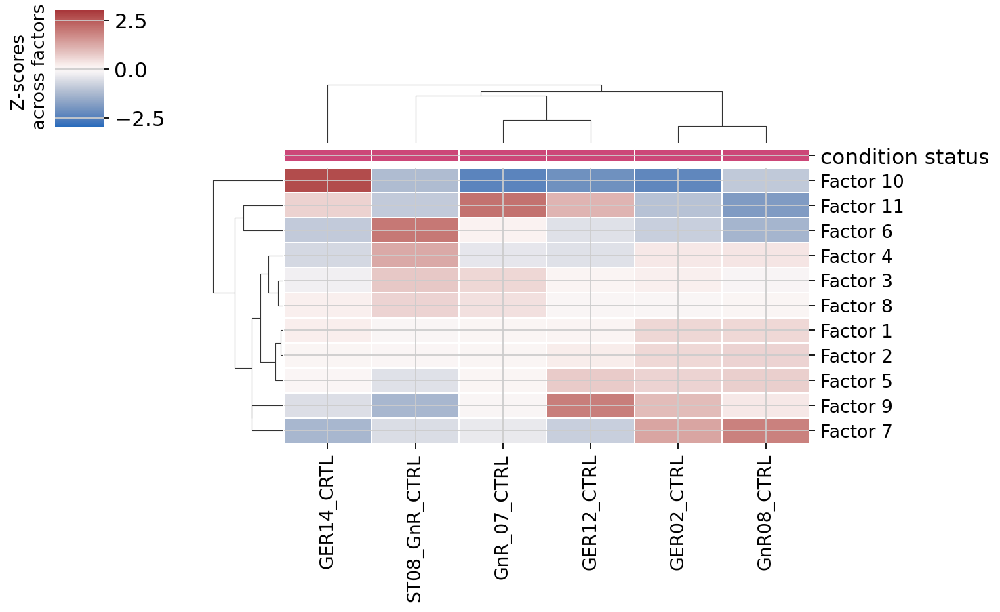

healthy_iav_tensor


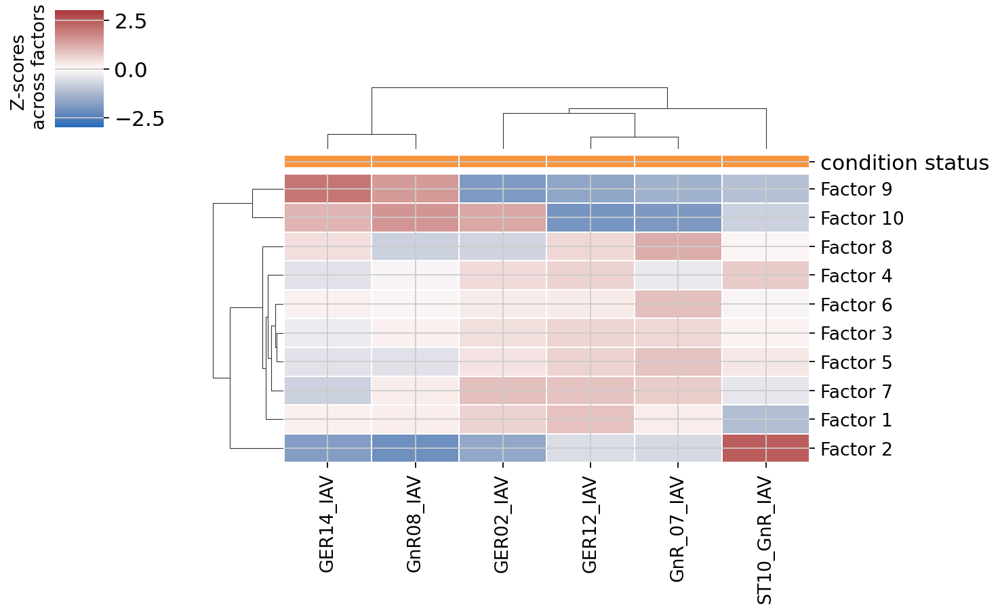

copd_ctrl_tensor


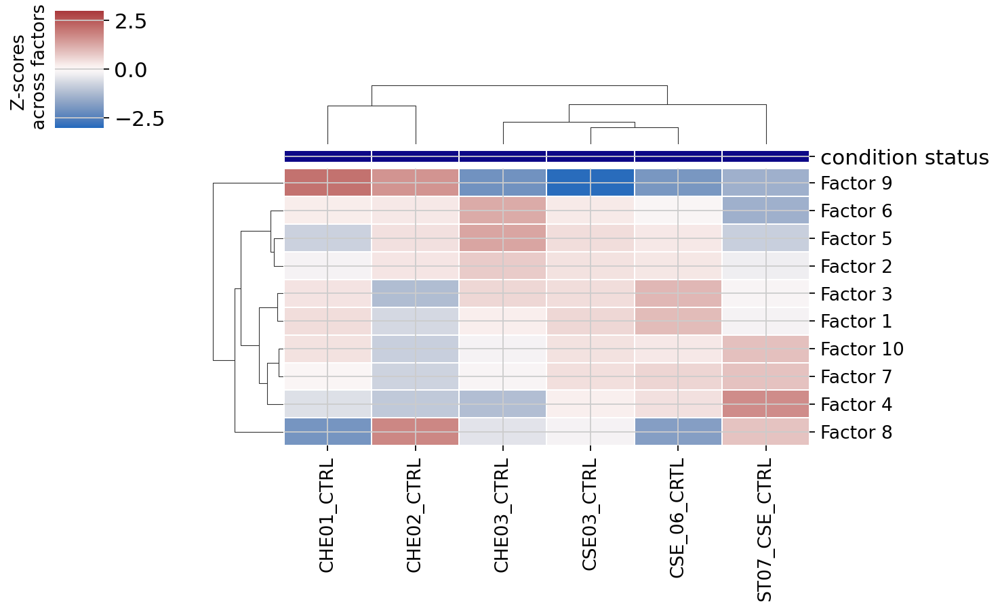

copd_iav_tensor


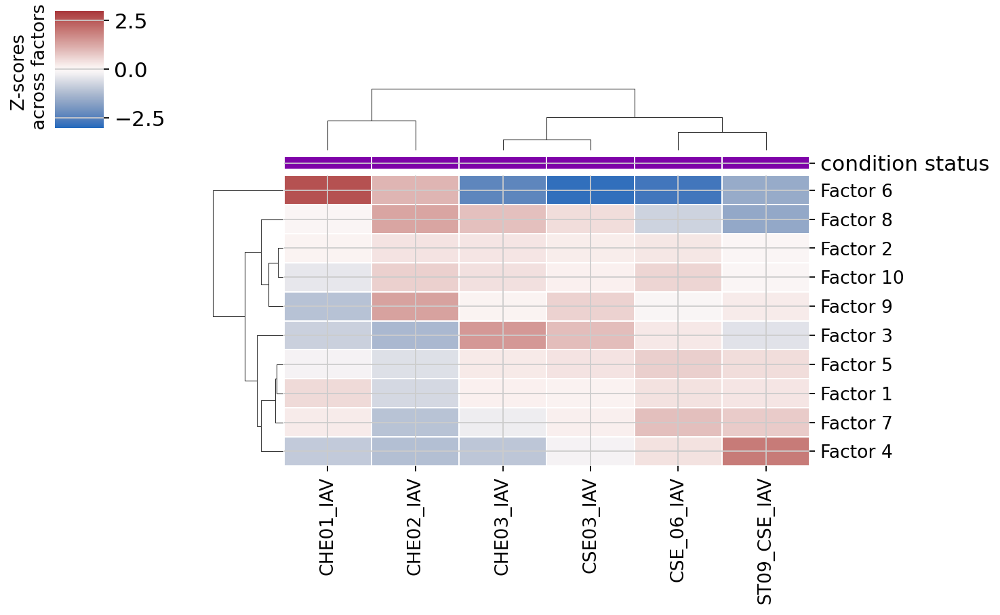

In [12]:
for tensor_name, tensor in tensor_dict.items():
    print(tensor_name)
    c2c.plotting.loading_clustermap(tensor.factors['Contexts'],
                                use_zscore=True, # Whether standardizing the loadings across factors
                                col_colors=col_colors, # Change this to color by other properties
                                figsize=(9, 6),
                                dendrogram_ratio=0.3,
                                cbar_fontsize=12,
                                tick_fontsize=12
                                )
    plt.show()

healthy_ctrl_tensor
healthy_iav_tensor
copd_ctrl_tensor
copd_iav_tensor


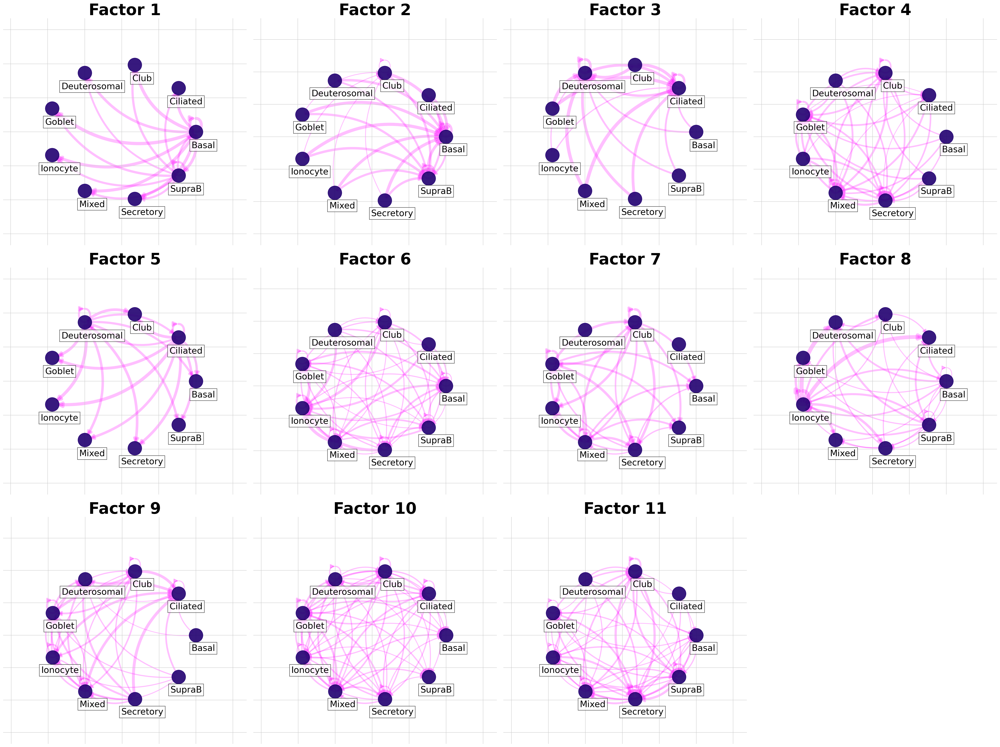

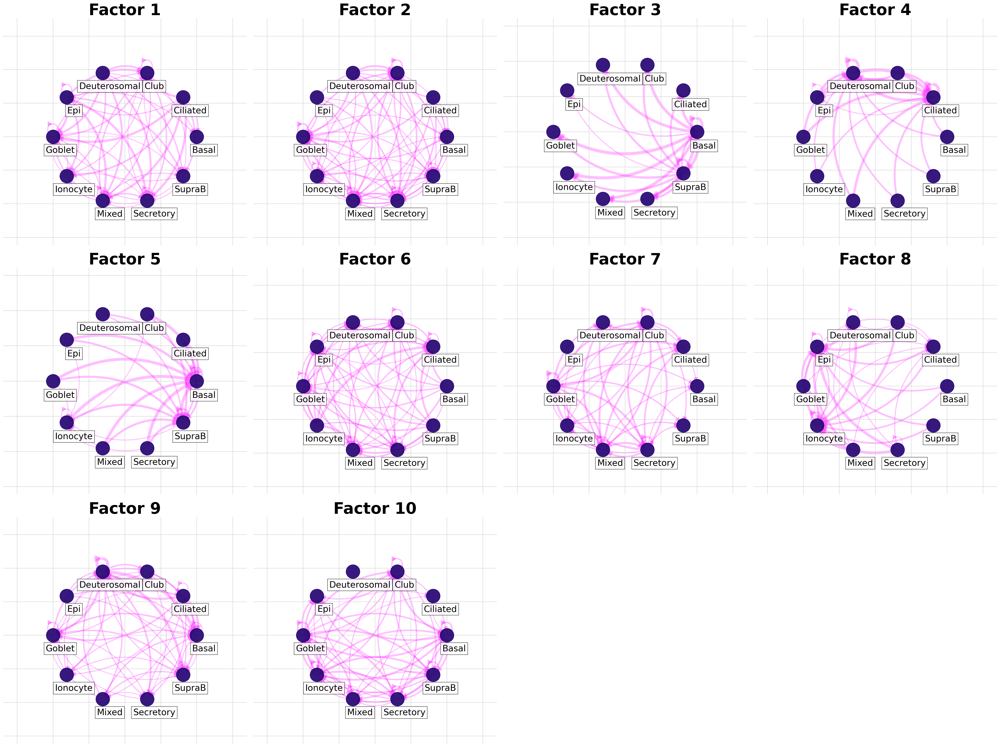

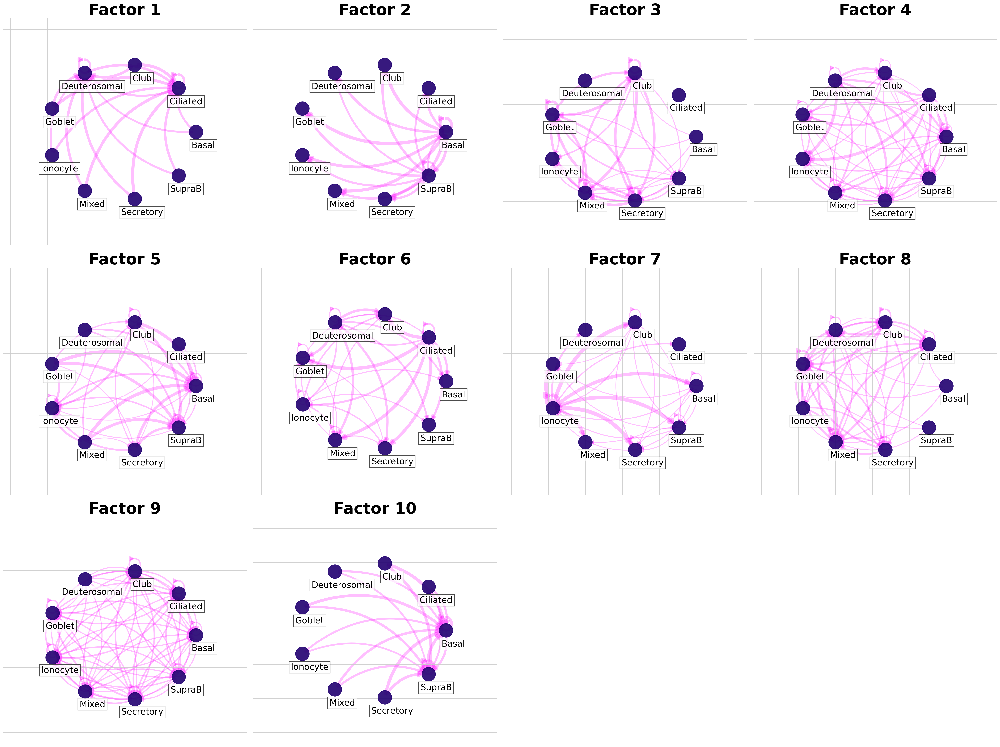

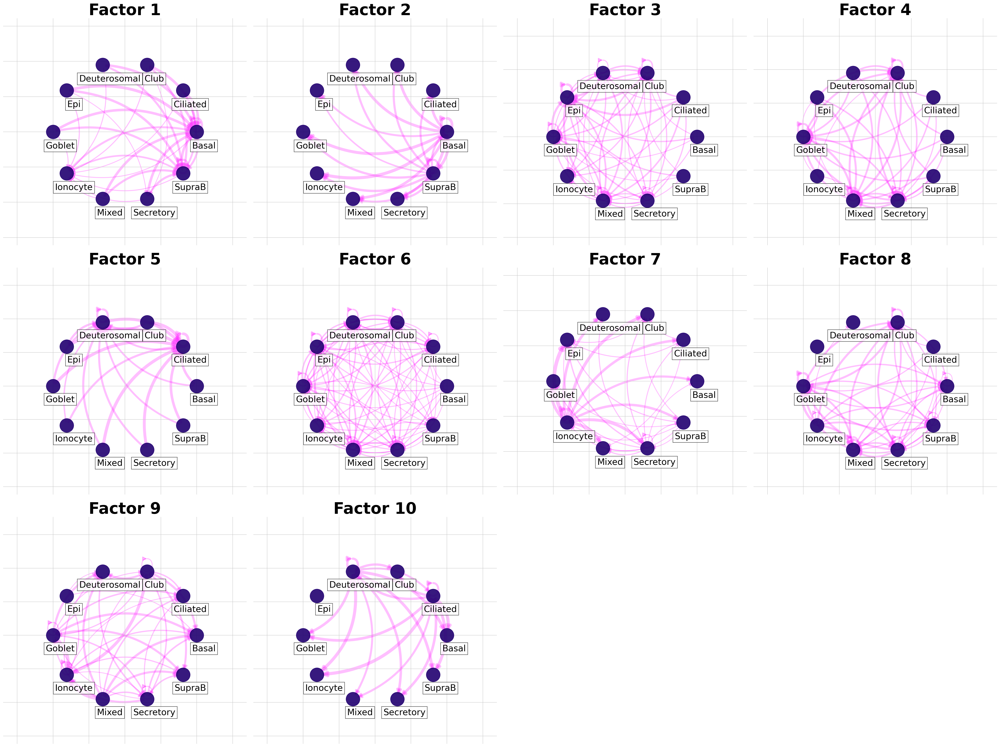

In [13]:
for tensor_name, tensor in tensor_dict.items():
    included_factors = list(tensor.factors['Contexts'].columns)
    print(tensor_name)
    c2c.plotting.ccc_networks_plot(
        tensor.factors,
        included_factors=included_factors,
        network_layout='circular',
        ccc_threshold=0.07, # Only important communication
        nrows=3,
        panel_size=(8, 8), # This changes the size of each figure panel.
    )
    plt.show

In [15]:
cell_types = set(adata_all.obs['cell_compartment'])
tensor_1_signalling_arrays = get_tensor_signalling_arrays(
    tensor=tensor_dict['healthy_ctrl_tensor'],
    cell_types=cell_types
)
tensor_2_signalling_arrays = get_tensor_signalling_arrays(
    tensor=tensor_dict['healthy_iav_tensor'],
    cell_types=cell_types
)
find_mutual_best_fits(
    tensor_1_signalling_arrays,
    tensor_2_signalling_arrays,
)

{'Factor 1': 'Factor 3',
 'Factor 2': 'Factor 5',
 'Factor 3': 'Factor 4',
 'Factor 10': 'Factor 7',
 'Factor 11': 'Factor 2'}

Best fits healthy_ctrl and copd_ctrl:
{'Factor 1': 'Factor 2',
 'Factor 2': 'Factor 10',
 'Factor 3': 'Factor 1',
 'Factor 5': 'Factor 6',
 'Factor 7': 'Factor 3',
 'Factor 8': 'Factor 7',
 'Factor 10': 'Factor 8'} 
Best fits healthy_ctrl and healthy_iav:
{'Factor 1': 'Factor 3',
 'Factor 2': 'Factor 5',
 'Factor 3': 'Factor 4',
 'Factor 10': 'Factor 7',
 'Factor 11': 'Factor 2'}
Best fits for healthy_ctrl and copd_iav:
{'Factor 1': 'Factor 2',
 'Factor 2': 'Factor 1',
 'Factor 3': 'Factor 5',
 'Factor 5': 'Factor 10',
 'Factor 8': 'Factor 7',
 'Factor 11': 'Factor 8'}
Best fits for healthy_iav and copd_ctrl:
{'Factor 2': 'Factor 9',
 'Factor 3': 'Factor 2',
 'Factor 4': 'Factor 1',
 'Factor 5': 'Factor 10',
 'Factor 7': 'Factor 8',
 'Factor 9': 'Factor 4'}
Best fits for healthy_iav and copd_iav:
{'Factor 2': 'Factor 4',
 'Factor 3': 'Factor 2',
 'Factor 4': 'Factor 5',
 'Factor 5': 'Factor 1'}
Best fits for copd_ctrl and copd_iav:
{'Factor 1': 'Factor 5',
 'Factor 2': 'Factor 2',
 'Factor 6': 'Factor 10',
 'Factor 7': 'Factor 7',
 'Factor 9': 'Factor 8',
 'Factor 10': 'Factor 1'}
Fits for healthy_ctrl, healthy_iav, copd_ctrl:

In [16]:
sender_receiver_collection = pd.concat(
    [
        return_sender_receiver_factor_df(
            tensor=tensor_dict['healthy_ctrl_tensor'],
            cell_types=cell_types,
            factor_condition='healthy_ctrl'
        ),
        return_sender_receiver_factor_df(
            tensor=tensor_dict['healthy_iav_tensor'],
            cell_types=cell_types,
            factor_condition='healthy_iav'
        ),
        return_sender_receiver_factor_df(
            tensor=tensor_dict['copd_ctrl_tensor'],
            cell_types=cell_types,
            factor_condition='copd_ctrl'
        ),
        return_sender_receiver_factor_df(
            tensor=tensor_dict['copd_iav_tensor'],
            cell_types=cell_types,
            factor_condition='copd_iav'
        ),
    ],
    axis=1
)
find_outlier_vectors(sender_receiver_collection, aggregate_func=np.mean, axis=1)

,0
copd_ctrl_Factor 2,0.395696
healthy_ctrl_Factor 1,0.401482
copd_iav_Factor 2,0.423200
healthy_iav_Factor 3,0.426432
copd_iav_Factor 10,0.446202
healthy_ctrl_Factor 5,0.454393
copd_ctrl_Factor 7,0.545791
healthy_ctrl_Factor 8,0.592989
copd_ctrl_Factor 6,0.603258
copd_iav_Factor 7,0.646608
